In [17]:
!pip install scipy


Looking in indexes: http://mirrors.aliyun.com/pypi/simple


In [18]:
import os, time, warnings, itertools, io, base64
import numpy as np
from scipy.io import loadmat
from scipy.signal import chirp, windows, medfilt
from scipy.ndimage import uniform_filter1d, maximum_filter
from PIL import Image
from IPython.display import display, HTML

%matplotlib inline
import matplotlib
import matplotlib.pyplot as plt

warnings.filterwarnings('ignore')

import cupy as cp
print(f'CuPy 版本: {cp.__version__}')
print(f'GPU 设备:  {cp.cuda.runtime.getDeviceCount()} 个')
dev = cp.cuda.Device(0)
print(f'当前 GPU:  {dev.id} — {cp.cuda.runtime.getDeviceProperties(0)["name"].decode()}')
mem = dev.mem_info
print(f'显存:      {mem[1]/1e9:.1f} GB 总量, {mem[0]/1e9:.1f} GB 可用')

CuPy 版本: 14.0.1
GPU 设备:  1 个
当前 GPU:  0 — NVIDIA GeForce RTX 5090
显存:      33.7 GB 总量, 33.0 GB 可用


In [19]:
# 先查你的 CUDA 版本
!nvcc --version

nvcc: NVIDIA (R) Cuda compiler driver
Copyright (c) 2005-2025 NVIDIA Corporation
Built on Fri_Feb_21_20:23:50_PST_2025
Cuda compilation tools, release 12.8, V12.8.93
Build cuda_12.8.r12.8/compiler.35583870_0


In [20]:
!pip install cupy-cuda12x

Looking in indexes: http://mirrors.aliyun.com/pypi/simple


In [21]:
# ============ 改这里 ============
DATA_PATH  = '/root/autodl-tmp/sig_data.mat'
OUTPUT_DIR = '/root/autodl-tmp/output'
# ================================

os.makedirs(OUTPUT_DIR, exist_ok=True)

# 物理参数
FS       = 250e3
C        = 1500.0
F_LOW    = 10e3
F_HIGH   = 30e3
T_PULSE  = 5e-3
BW       = F_HIGH - F_LOW
FC       = (F_LOW + F_HIGH) / 2
D_ELEM   = 0.0375
N_CH     = 16
N_SAMP   = 65500
N_PULSE  = 96
BT       = BW * T_PULSE

N_REF = int(T_PULSE * FS)
N_FFT = int(2 ** np.ceil(np.log2(N_SAMP + N_REF)))

# 距离轴
MAX_RANGE_M = 100.0
MAX_R_SAMP  = int(2 * MAX_RANGE_M / C * FS)
R_DECIM     = max(1, MAX_R_SAMP // 1500)
R_IDX       = np.arange(0, min(MAX_R_SAMP, N_FFT), R_DECIM)
N_RANGE     = len(R_IDX)
R_AXIS      = (R_IDX * C / (2 * FS)).astype(np.float32)

# 新方法: 20 波束 (目标方位范围小可收窄, 如 -30~30)
N_BEAMS_HL  = 90
BEAM_ANGLES = np.linspace(-85, 85, N_BEAMS_HL).astype(np.float32)

# 旧方法: 361 波束
THETA_FULL   = np.arange(-90, 90.5, 0.5, dtype=np.float32)
N_BEAMS_FULL = len(THETA_FULL)

print(f'BT={BT:.0f} → 处理增益 {10*np.log10(BT):.1f} dB')
print(f'距离分辨率: {C/(2*BW)*100:.2f} cm')
print(f'FFT={N_FFT}  距离门={N_RANGE}  HL波束={N_BEAMS_HL}  全波束={N_BEAMS_FULL}')
print(f'数据路径: {DATA_PATH}')
print(f'输出目录: {OUTPUT_DIR}')

BT=100 → 处理增益 20.0 dB
距离分辨率: 3.75 cm
FFT=131072  距离门=1516  HL波束=90  全波束=361
数据路径: /root/autodl-tmp/sig_data.mat
输出目录: /root/autodl-tmp/output


In [22]:
print(f'加载 {DATA_PATH} ...')
mat = loadmat(DATA_PATH)
cands = {k: v for k, v in mat.items() if not k.startswith('__')}
key = max(cands, key=lambda k: np.prod(cands[k].shape))
raw = cands[key]
print(f"变量='{key}'  shape={raw.shape}  dtype={raw.dtype}")

target = (N_CH, N_SAMP, N_PULSE)
data = None
if raw.shape == target:
    data = raw.astype(np.float32)
else:
    for perm in itertools.permutations(range(3)):
        if tuple(raw.shape[i] for i in perm) == target:
            data = raw.transpose(perm).astype(np.float32)
            print(f'已转置 {perm}')
            break

if data is None:
    raise ValueError(f'无法映射 {raw.shape} → {target}')

del mat, raw
print(f'数据就绪: {data.shape} ({data.nbytes/1e9:.2f} GB)')

加载 /root/autodl-tmp/sig_data.mat ...
变量='sig_data'  shape=(16, 65500, 96)  dtype=float64
数据就绪: (16, 65500, 96) (0.40 GB)


In [23]:
# 匹配滤波器
t_ref = np.arange(0, T_PULSE, 1/FS)
ref = chirp(t_ref, f0=F_LOW, t1=T_PULSE, f1=F_HIGH) * windows.hamming(len(t_ref))
pad = np.zeros(N_FFT, dtype=np.float32)
pad[:len(ref)] = ref.astype(np.float32)
H_mf = np.conj(np.fft.rfft(pad)).astype(np.complex64)

def make_steering(angles):
    ch  = np.arange(N_CH, dtype=np.float32)
    rad = np.radians(angles).astype(np.float32)
    ph  = np.float32(-2 * np.pi * FC * D_ELEM / C)
    return np.exp(1j * ph * ch[:, None] * np.sin(rad[None, :])).astype(np.complex64)

S_hl   = make_steering(BEAM_ANGLES)   # (16, 20)
S_full = make_steering(THETA_FULL)    # (16, 361)

# 全部传到 GPU 显存, 后面就不需要反复传了
H_g     = cp.asarray(H_mf)
S_hl_g  = cp.asarray(S_hl)
S_full_g = cp.asarray(S_full)
R_IDX_g = cp.asarray(R_IDX)

print(f'匹配滤波器: {H_mf.shape}')
print(f'导向矢量 HL:   {S_hl.shape}')
print(f'导向矢量 FULL: {S_full.shape}')
print('全部已上传 GPU ✓')

匹配滤波器: (65537,)
导向矢量 HL:   (16, 90)
导向矢量 FULL: (16, 361)
全部已上传 GPU ✓


In [24]:
def gpu_compress_bf(pulse_data_np, S_g):
    """
    GPU: 单脉冲 → 脉冲压缩 → 波束形成
    pulse_data_np: (16, 65500) numpy float32
    S_g:           (16, n_beams) cupy complex64 — 已在显存
    返回:          (N_RANGE, n_beams) numpy float32
    """
    buf = cp.zeros((N_CH, N_FFT), dtype=cp.float32)
    buf[:, :N_SAMP] = cp.asarray(pulse_data_np)
    comp = cp.fft.irfft(cp.fft.rfft(buf, axis=1) * H_g[None, :], n=N_FFT, axis=1)
    snap = comp[:, R_IDX_g].astype(cp.complex64)
    bf   = cp.dot(S_g.conj().T, snap)
    return cp.asnumpy(cp.abs(bf.T) ** 2)

print('GPU 处理函数已定义 ✓')

GPU 处理函数已定义 ✓


In [ ]:
# ====== 匹配滤波 + 波束形成 + 卡尔曼滤波追踪 ======

# === 可调参数 ===
MASK_RANGE    = 8.0
SEARCH_RADIUS = 2.0
Q_STD         = 0.3   # 过程噪声 (目标加速度不确定性, m)
R_STD         = 1.0   # 观测噪声 (检测位置误差, m)
INNOV_GATE    = 2.0
MAX_COAST     = 1

# --- GPU 波束形成 ---
print(f'[1] 脉冲压缩 + {N_BEAMS_HL}波束 CBF (GPU)...')
t0 = time.time()
hl_raw = np.zeros((N_PULSE, N_RANGE, N_BEAMS_HL), dtype=np.float32)
for p in range(N_PULSE):
    hl_raw[p] = gpu_compress_bf(data[:, :, p], S_hl_g)
cp.cuda.Stream.null.synchronize()
print(f'  完成! {time.time()-t0:.1f}s')

# --- TPSW 归一化 ---
print('[2] TPSW 归一化...')
hl_norm = np.empty_like(hl_raw)
for p in range(N_PULSE):
    f = 10 * np.log10(hl_raw[p] + 1e-30)
    f -= uniform_filter1d(f, size=80, axis=0, mode='reflect')
    f -= uniform_filter1d(f, size=5,  axis=1, mode='reflect')
    hl_norm[p] = f

# --- 近场屏蔽 ---
mask = R_AXIS >= MASK_RANGE
hl_use = hl_norm[:, mask, :]
r_use  = R_AXIS[mask]

def pos_to_xy(r, b_deg):
    return r * np.sin(np.radians(b_deg)), r * np.cos(np.radians(b_deg))

# --- 卡尔曼滤波函数（向量化搜索）---
def run_kalman(Q_STD, R_STD, det_maps=None):
    src = det_maps if det_maps is not None else hl_use
    dt = 1.0
    F = np.array([[1,0,dt,0],[0,1,0,dt],[0,0,1,0],[0,0,0,1]], dtype=np.float64)
    G = np.array([[.5*dt**2,0],[0,.5*dt**2],[dt,0],[0,dt]], dtype=np.float64)
    Q_mat = (Q_STD**2) * G @ G.T
    H     = np.array([[1,0,0,0],[0,1,0,0]], dtype=np.float64)
    R_mat = np.eye(2) * R_STD**2

    idx0 = np.unravel_index(np.argmax(hl_use[0]), hl_use[0].shape)
    x0, y0 = pos_to_xy(r_use[idx0[0]], BEAM_ANGLES[idx0[1]])
    state = np.array([x0, y0, 0.0, 0.0], dtype=np.float64)
    P = np.eye(4) * 5.0

    kf_x  = np.zeros(N_PULSE); kf_y  = np.zeros(N_PULSE)
    raw_r_o = np.zeros(N_PULSE); raw_b_o = np.zeros(N_PULSE)
    snr_o = np.zeros(N_PULSE)
    kf_x[0], kf_y[0] = x0, y0
    raw_r_o[0], raw_b_o[0] = r_use[idx0[0]], BEAM_ANGLES[idx0[1]]
    snr_o[0] = hl_use[0][idx0]
    coast = 0

    # 预计算所有 (range, beam) 格点的 XY 坐标（避免双重 Python 循环）
    cx_all = (r_use[:, None] * np.sin(np.radians(BEAM_ANGLES[None, :]))).ravel()
    cy_all = (r_use[:, None] * np.cos(np.radians(BEAM_ANGLES[None, :]))).ravel()

    Y_STOP = 2.0   # Y 低于此值时目标进入盲区，冻结轨迹

    for p in range(1, N_PULSE):
        sp = F @ state
        Pp = F @ P @ F.T + Q_mat
        px, py = sp[0], sp[1]

        # 目标已进入盲区：冻结最后位置，结束追踪
        if py < Y_STOP:
            kf_x[p:] = kf_x[p-1]
            kf_y[p:] = kf_y[p-1]
            raw_r_o[p:] = raw_r_o[p-1]
            raw_b_o[p:] = raw_b_o[p-1]
            break

        dist2  = (cx_all - px)**2 + (cy_all - py)**2
        in_win = dist2 <= SEARCH_RADIUS**2
        found  = bool(in_win.any())

        if found:
            vals = src[p].ravel().copy()
            vals[~in_win] = -999
            flat = int(np.argmax(vals))
            ri, bi = divmod(flat, N_BEAMS_HL)
            mx, my = pos_to_xy(r_use[ri], BEAM_ANGLES[bi])

            if np.sqrt((mx - px)**2 + (my - py)**2) <= INNOV_GATE:
                # 正常更新
                inn = np.array([mx, my]) - H @ sp
                S   = H @ Pp @ H.T + R_mat
                K   = Pp @ H.T @ np.linalg.inv(S)
                state = sp + K @ inn
                P     = (np.eye(4) - K @ H) @ Pp
                coast = 0
                raw_r_o[p] = r_use[ri]; raw_b_o[p] = BEAM_ANGLES[bi]
                snr_o[p] = vals[flat]
            else:
                # 观测离群：只 coasting，不强制重锁
                coast += 1
                state, P = sp, Pp
                raw_r_o[p], raw_b_o[p] = raw_r_o[p-1], raw_b_o[p-1]
        else:
            # 搜索窗内无目标：只 coasting，不做全局重搜索
            coast += 1
            state, P = sp, Pp
            raw_r_o[p], raw_b_o[p] = raw_r_o[p-1], raw_b_o[p-1]

        kf_x[p], kf_y[p] = state[0], state[1]

    return kf_x, kf_y, state, raw_r_o, raw_b_o, snr_o

# --- 默认跑一次（保持原变量名）---
print(f'[3] 卡尔曼追踪 (Q={Q_STD}, R={R_STD})...')
kf_x, kf_y, state, raw_r, raw_b, snr = run_kalman(Q_STD, R_STD)

# --- 转回极坐标 ---
bright_r = np.sqrt(kf_x**2 + kf_y**2)
bright_b = np.degrees(np.arctan2(kf_x, kf_y))

total_dist = np.sqrt((kf_x[-1]-kf_x[0])**2 + (kf_y[-1]-kf_y[0])**2)
print(f'\n  方位: {bright_b.min():.1f}° ~ {bright_b.max():.1f}°')
print(f'  距离: {bright_r.min():.1f}m ~ {bright_r.max():.1f}m')
print(f'  起→终直线: {total_dist:.1f} m')
print(f'  估计速度: vx={state[2]:.2f} vy={state[3]:.2f} m/step')

# --- 预览 ---
fig, axes = plt.subplots(1, 3, figsize=(18, 5))
pa = np.arange(N_PULSE)

ax = axes[0]
ax.plot(pa, raw_b, '.', ms=2, color='gray', alpha=0.3, label='观测')
ax.plot(pa, bright_b, '-o', ms=3, lw=1.5, color='steelblue', label='卡尔曼')
ax.set_xlabel('Pulse'); ax.set_ylabel('Bearing (°)')
ax.set_title('Bearing vs Time'); ax.grid(True, alpha=0.3); ax.legend(fontsize=8)

ax = axes[1]
ax.plot(pa, raw_r, '.', ms=2, color='gray', alpha=0.3, label='观测')
ax.plot(pa, bright_r, '-o', ms=3, lw=1.5, color='tomato', label='卡尔曼')
ax.set_xlabel('Pulse'); ax.set_ylabel('Range (m)')
ax.set_title('Range vs Time'); ax.grid(True, alpha=0.3)
ax.invert_yaxis(); ax.legend(fontsize=8)

ax = axes[2]
sc = ax.scatter(kf_x, kf_y, c=pa, cmap='viridis', s=40, edgecolors='k', lw=0.3)
ax.plot(kf_x, kf_y, '-', color='gray', lw=0.8, alpha=0.5)
ax.plot(kf_x[0], kf_y[0], 'g^', ms=12, label='Start')
ax.plot(kf_x[-1], kf_y[-1], 'rs', ms=12, label='End')
ax.set_xlabel('X (m)'); ax.set_ylabel('Y (m)')
ax.set_title(f'XY Trajectory ({total_dist:.1f}m)'); ax.set_aspect('equal')
ax.grid(True, alpha=0.3); ax.legend(fontsize=8)
plt.colorbar(sc, ax=ax, label='Pulse #')

plt.tight_layout()
plt.show()


In [ ]:
# ====== 卡尔曼参数网格搜索（线性拟合伪真值）======
from tqdm.auto import tqdm

HALF  = N_PULSE // 2
t_all = np.arange(N_PULSE)

# 1. 对前半段做线性拟合
ax_fit, bx_fit = np.polyfit(np.arange(HALF), kf_x[:HALF], 1)
ay_fit, by_fit = np.polyfit(np.arange(HALF), kf_y[:HALF], 1)
gt_x = ax_fit * t_all + bx_fit
gt_y = ay_fit * t_all + by_fit

# 2. 有效观测区间：Y>0（目标在阵列前方，方位角在 ±90° 以内）
#    Y=0 对应方位角=90°，超出波束覆盖范围（±85°），目标不可见
valid = gt_y > 0
if not valid.any():
    valid = np.ones(N_PULSE, dtype=bool)   # fallback：全段
t_valid = np.where(valid)[0]
t_stop  = t_valid[-1]
print(f'有效评估区间: pulse 0 ~ {t_stop}（Y=0 处目标进入盲区）')

# 速度约束：±50% 容差（m/step，不依赖未知 PRI）
v_fit = np.sqrt(ax_fit**2 + ay_fit**2)
V_MIN, V_MAX = v_fit * 0.5, v_fit * 2.0
print(f'拟合速度: {v_fit:.4f} m/step，约束范围: [{V_MIN:.4f}, {V_MAX:.4f}]')

# 3. 网格搜索（带进度条）
Q_GRID = [0.05, 0.1, 0.2, 0.3, 0.5, 0.8, 1.5]
R_GRID = [0.3,  0.5, 0.8, 1.0, 1.5, 2.5, 4.0]
best_mse, best_Q, best_R = np.inf, Q_STD, R_STD
mse_grid = np.full((len(Q_GRID), len(R_GRID)), np.nan)

params = [(qi, q, ri, r)
          for qi, q in enumerate(Q_GRID)
          for ri, r in enumerate(R_GRID)]

for qi, q, ri, r in tqdm(params, desc='Grid Search', ncols=70):
    x_out, y_out, st, _, _, _ = run_kalman(q, r)
    speed = np.sqrt(st[2]**2 + st[3]**2)
    if not (V_MIN <= speed <= V_MAX):
        continue
    # 只在有效观测区间（Y>0）计算 MSE
    mse = np.mean((x_out[t_valid] - gt_x[t_valid])**2 +
                  (y_out[t_valid] - gt_y[t_valid])**2)
    mse_grid[qi, ri] = mse
    if mse < best_mse:
        best_mse, best_Q, best_R = mse, q, r

if best_mse == np.inf:
    print('警告：所有参数组合均被速度约束排除，使用原始参数')
    best_Q, best_R = Q_STD, R_STD
else:
    print(f'最优参数: Q_STD={best_Q}, R_STD={best_R}, MSE={best_mse:.4f}')

# 4. 最优参数重跑
kf_x_opt, kf_y_opt, _, _, _, _ = run_kalman(best_Q, best_R)

# 5. 对比图 + MSE 热图
fig, axes = plt.subplots(1, 2, figsize=(14, 5))

ax = axes[0]
ax.plot(kf_x, kf_y, '-o', ms=3, lw=1.2, alpha=0.6, color='steelblue',
        label=f'原始 Q={Q_STD}, R={R_STD}')
ax.plot(kf_x_opt, kf_y_opt, '-o', ms=3, lw=1.5, color='tomato',
        label=f'优化 Q={best_Q}, R={best_R}')
# 伪真值只画到 Y=0（可见范围）
ax.plot(gt_x[valid], gt_y[valid], '--', lw=1.5, color='green',
        label=f'伪真值（pulse 0~{t_stop}）')
ax.axhline(0, color='k', lw=0.8, ls=':', alpha=0.4, label='Y=0 观测边界')
ax.set(xlabel='X (m)', ylabel='Y (m)', title='XY 轨迹对比', aspect='equal')
ax.legend(fontsize=8); ax.grid(alpha=0.3)

ax = axes[1]
im = ax.imshow(mse_grid, cmap='viridis_r', aspect='auto')
ax.set_xticks(range(len(R_GRID))); ax.set_xticklabels(R_GRID, rotation=45)
ax.set_yticks(range(len(Q_GRID))); ax.set_yticklabels(Q_GRID)
ax.set(xlabel='R_STD', ylabel='Q_STD', title='MSE 热图 (nan=速度约束排除)')
plt.colorbar(im, ax=ax)

plt.tight_layout(); plt.show()


In [ ]:
# ====== UNet 训练标签生成 ======
import torch, torch.nn as nn, torch.nn.functional as F

# 输入归一化（全局 1-99 百分位）
hl_lo, hl_hi = np.percentile(hl_use, 1), np.percentile(hl_use, 99)
hl_in = np.clip((hl_use - hl_lo) / (hl_hi - hl_lo + 1e-8), 0, 1).astype(np.float32)

# 高斯标签：只对有效观测帧（gt_y > 0）生成，sigma=2 个格点
H_map, W_map = hl_in.shape[1], hl_in.shape[2]
yy, xx = np.mgrid[:H_map, :W_map]
labels = np.zeros((N_PULSE, H_map, W_map), dtype=np.float32)
for p in t_valid:
    r_t = np.sqrt(gt_x[p]**2 + gt_y[p]**2)
    b_t = np.degrees(np.arctan2(gt_x[p], gt_y[p]))
    ri  = int(np.argmin(np.abs(r_use - r_t)))
    bi  = int(np.argmin(np.abs(BEAM_ANGLES - b_t)))
    labels[p] = np.exp(-((yy-ri)**2 + (xx-bi)**2) / (2*2.0**2))

print(f'标签生成完毕 | 训练帧: {len(t_valid)} | 帧尺寸: {H_map}×{W_map}')


In [ ]:
# ====== UNet 定义 + 训练 ======
DEVICE = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

class UNet(nn.Module):
    def __init__(self, ch=8):
        super().__init__()
        def blk(ic, oc): return nn.Sequential(
            nn.Conv2d(ic,oc,3,padding=1), nn.ReLU(inplace=True),
            nn.Conv2d(oc,oc,3,padding=1), nn.ReLU(inplace=True))
        self.e1,self.e2,self.e3 = blk(1,ch), blk(ch,ch*2), blk(ch*2,ch*4)
        self.d2,self.d1 = blk(ch*6,ch*2), blk(ch*3,ch)
        self.pool = nn.MaxPool2d(2)
        self.out  = nn.Conv2d(ch, 1, 1)

    def forward(self, x):
        e1 = self.e1(x)
        e2 = self.e2(self.pool(e1))
        e3 = self.e3(self.pool(e2))
        up = lambda t, ref: F.interpolate(t, ref.shape[2:], mode='bilinear', align_corners=False)
        d2 = self.d2(torch.cat([up(e3,e2), e2], 1))
        d1 = self.d1(torch.cat([up(d2,e1), e1], 1))
        return torch.sigmoid(self.out(d1))

model = UNet().to(DEVICE)
opt   = torch.optim.Adam(model.parameters(), lr=1e-3)
X_tr  = torch.tensor(hl_in[t_valid, None]).to(DEVICE)   # (N_valid, 1, H, W)
Y_tr  = torch.tensor(labels[t_valid, None]).to(DEVICE)

for ep in tqdm(range(300), desc='Train UNet', ncols=70):
    model.train()
    loss = F.mse_loss(model(X_tr + torch.randn_like(X_tr)*0.05), Y_tr)
    opt.zero_grad(); loss.backward(); opt.step()

model.eval()
with torch.no_grad():
    unet_out = model(torch.tensor(hl_in[:,None]).to(DEVICE)).cpu().numpy()[:,0]
print(f'推理完毕 | 输出形状: {unet_out.shape}')


In [ ]:
# ====== UNet + 卡尔曼追踪对比 ======
kf_x_unet, kf_y_unet, *_ = run_kalman(best_Q, best_R, det_maps=unet_out)

fig, ax = plt.subplots(figsize=(7, 9))
ax.plot(kf_x,      kf_y,      '-o', ms=3, lw=1.2, alpha=0.6,
        color='steelblue', label=f'Kalman only  Q={Q_STD} R={R_STD}')
ax.plot(kf_x_unet, kf_y_unet, '-o', ms=3, lw=1.5,
        color='tomato', label=f'UNet+Kalman  Q={best_Q} R={best_R}')
ax.plot(gt_x[valid], gt_y[valid], '--', lw=1.5, color='green', label='伪真值')
ax.axhline(0, color='k', lw=0.8, ls=':', alpha=0.4)
ax.set(xlabel='X (m)', ylabel='Y (m)', title='UNet+Kalman vs Kalman only', aspect='equal')
ax.legend(fontsize=9); ax.grid(alpha=0.3)
plt.tight_layout(); plt.show()


In [ ]:
# ====== sig_data_zhu.mat UNet 推理 ======
import os

DATA_ZHU = os.path.join(os.path.dirname(DATA_PATH), 'sig_data_zhu.mat')
print(f'加载 {DATA_ZHU} ...')
mat_z = loadmat(DATA_ZHU)
raw_z = max((v for k,v in mat_z.items() if not k.startswith('__')),
            key=lambda v: np.prod(v.shape))

# 整理到 (N_CH, N_SAMP, N_PULSE_Z)
data_z = None
for perm in itertools.permutations(range(3)):
    if raw_z.shape[perm[0]] == N_CH and raw_z.shape[perm[1]] == N_SAMP:
        data_z = raw_z.transpose(perm).astype(np.float32)
        break
if data_z is None:
    raise ValueError(f'无法识别数据维度: {raw_z.shape}')
N_PULSE_Z = data_z.shape[2]
print(f'数据形状: {data_z.shape}')

# [1] GPU 波束形成
print(f'[1] 波束形成 ({N_PULSE_Z} pulses)...')
hl_raw_z = np.zeros((N_PULSE_Z, N_RANGE, N_BEAMS_HL), dtype=np.float32)
for p in range(N_PULSE_Z):
    hl_raw_z[p] = gpu_compress_bf(data_z[:, :, p], S_hl_g)
cp.cuda.Stream.null.synchronize()

# [2] TPSW 归一化
print('[2] TPSW 归一化...')
hl_norm_z = np.empty_like(hl_raw_z)
for p in range(N_PULSE_Z):
    f = 10 * np.log10(hl_raw_z[p] + 1e-30)
    f -= uniform_filter1d(f, size=80, axis=0, mode='reflect')
    f -= uniform_filter1d(f, size=5,  axis=1, mode='reflect')
    hl_norm_z[p] = f

hl_use_z = hl_norm_z[:, mask, :]                     # 复用同一近场掩膜
hl_in_z  = np.clip((hl_use_z - hl_lo) / (hl_hi - hl_lo + 1e-8), 0, 1).astype(np.float32)

# [3] UNet 推理（用已训练的 model）
print('[3] UNet 推理...')
model.eval()
with torch.no_grad():
    unet_z = model(torch.tensor(hl_in_z[:, None]).to(DEVICE)).cpu().numpy()[:, 0]

# [4] Kalman 追踪
print(f'[4] Kalman 追踪 (Q={best_Q}, R={best_R})...')
def run_on_new(hl_init, det_maps, Q_S, R_S, y_stop=2.0, max_lost=8):
    """
    max_lost: 连续失锁帧数上限，超过则冻结轨迹（替代硬编码 Y 截止）
    y_stop:   Y 坐标截止（-999 表示不用）
    """
    n = len(det_maps)
    dt = 1.0
    F = np.array([[1,0,dt,0],[0,1,0,dt],[0,0,1,0],[0,0,0,1]], dtype=np.float64)
    G = np.array([[.5*dt**2,0],[0,.5*dt**2],[dt,0],[0,dt]], dtype=np.float64)
    Q_mat = (Q_S**2) * G @ G.T
    H     = np.array([[1,0,0,0],[0,1,0,0]], dtype=np.float64)
    R_mat = np.eye(2) * R_S**2
    cx_all = (r_use[:,None] * np.sin(np.radians(BEAM_ANGLES[None,:]))).ravel()
    cy_all = (r_use[:,None] * np.cos(np.radians(BEAM_ANGLES[None,:]))).ravel()

    idx0 = np.unravel_index(np.argmax(hl_init[0]), hl_init[0].shape)
    x0, y0 = pos_to_xy(r_use[idx0[0]], BEAM_ANGLES[idx0[1]])
    state = np.array([x0, y0, 0., 0.])
    P = np.eye(4) * 5.
    kf_x = np.full(n, x0); kf_y = np.full(n, y0)
    lost = 0

    for p in range(1, n):
        sp = F @ state; Pp = F @ P @ F.T + Q_mat
        px, py = sp[0], sp[1]
        if py < y_stop:
            kf_x[p:] = kf_x[p-1]; kf_y[p:] = kf_y[p-1]; break
        dist2 = (cx_all - px)**2 + (cy_all - py)**2
        in_win = dist2 <= SEARCH_RADIUS**2
        updated = False
        if in_win.any():
            vals = det_maps[p].ravel().copy(); vals[~in_win] = -999
            flat = int(np.argmax(vals))
            ri, bi = divmod(flat, N_BEAMS_HL)
            mx, my = pos_to_xy(r_use[ri], BEAM_ANGLES[bi])
            if np.sqrt((mx-px)**2 + (my-py)**2) <= INNOV_GATE:
                K = Pp @ H.T @ np.linalg.inv(H @ Pp @ H.T + R_mat)
                state = sp + K @ (np.array([mx,my]) - H @ sp)
                P = (np.eye(4) - K @ H) @ Pp
                lost = 0; updated = True
        if not updated:
            state, P = sp, Pp
            lost += 1
            if lost >= max_lost:           # 连续失锁太久，冻结
                kf_x[p:] = kf_x[p-1]; kf_y[p:] = kf_y[p-1]; break
        kf_x[p], kf_y[p] = state[0], state[1]
    return kf_x, kf_y

kfx_z, kfy_z = run_on_new(hl_use_z, unet_z, best_Q, best_R)

# 绘图
fig, ax = plt.subplots(figsize=(6, 9))
pa_z = np.arange(N_PULSE_Z)
sc = ax.scatter(kfx_z, kfy_z, c=pa_z, cmap='plasma', s=40, edgecolors='k', lw=0.3)
ax.plot(kfx_z, kfy_z, '-', color='gray', lw=0.8, alpha=0.5)
ax.plot(kfx_z[0],  kfy_z[0],  'g^', ms=12, label='Start')
ax.plot(kfx_z[-1], kfy_z[-1], 'rs', ms=12, label='End')
ax.axhline(0, color='k', lw=0.8, ls=':', alpha=0.4, label='Y=0 观测边界')
ax.set(xlabel='X (m)', ylabel='Y (m)',
       title='UNet+Kalman: sig_data_zhu', aspect='equal')
plt.colorbar(sc, ax=ax, label='Pulse #')
ax.legend(fontsize=9); ax.grid(alpha=0.3)
plt.tight_layout(); plt.show()


In [ ]:
# ====== sig_data_zhu.mat 纯卡尔曼追踪（对比 Cell 13）======
kfx_z_kf, kfy_z_kf = run_on_new(hl_use_z, hl_use_z, Q_STD, R_STD)

fig, axes = plt.subplots(1, 2, figsize=(14, 9))
pa_z = np.arange(N_PULSE_Z)

for ax, kfx, kfy, title, cmap in zip(
    axes,
    [kfx_z_kf, kfx_z],
    [kfy_z_kf, kfy_z],
    [f'Kalman only  Q={Q_STD} R={R_STD}', f'UNet+Kalman  Q={best_Q} R={best_R}'],
    ['viridis', 'plasma']
):
    sc = ax.scatter(kfx, kfy, c=pa_z, cmap=cmap, s=40, edgecolors='k', lw=0.3)
    ax.plot(kfx, kfy, '-', color='gray', lw=0.8, alpha=0.5)
    ax.plot(kfx[0],  kfy[0],  'g^', ms=12, label='Start')
    ax.plot(kfx[-1], kfy[-1], 'rs', ms=12, label='End')
    ax.axhline(0, color='k', lw=0.8, ls=':', alpha=0.4)
    ax.set(xlabel='X (m)', ylabel='Y (m)', title=title, aspect='equal')
    plt.colorbar(sc, ax=ax, label='Pulse #')
    ax.legend(fontsize=9); ax.grid(alpha=0.3)

plt.suptitle('sig_data_zhu.mat', fontsize=13)
plt.tight_layout(); plt.show()


In [ ]:
# ====== 多数据集 UNet 训练 ======

def make_labels(hl_data, search_r=3.0, sigma=2.0):
    """贪心追踪 → 前半段线性拟合 → 高斯标签，适用于任意数据集。"""
    n = len(hl_data)
    cx = (r_use[:,None] * np.sin(np.radians(BEAM_ANGLES[None,:]))).ravel()
    cy = (r_use[:,None] * np.cos(np.radians(BEAM_ANGLES[None,:]))).ravel()
    H, W = hl_data.shape[1], hl_data.shape[2]
    yy, xx = np.mgrid[:H, :W]

    # 贪心追踪：每帧在前一帧位置附近搜最亮点
    det_x, det_y = np.zeros(n), np.zeros(n)
    idx0 = np.unravel_index(np.argmax(hl_data[0]), hl_data[0].shape)
    px, py = pos_to_xy(r_use[idx0[0]], BEAM_ANGLES[idx0[1]])
    det_x[0], det_y[0] = px, py
    for p in range(1, n):
        d2 = (cx - px)**2 + (cy - py)**2
        win = d2 <= search_r**2
        if win.any():
            v = hl_data[p].ravel().copy(); v[~win] = -999
            ri, bi = divmod(int(np.argmax(v)), N_BEAMS_HL)
            px, py = pos_to_xy(r_use[ri], BEAM_ANGLES[bi])
        det_x[p], det_y[p] = px, py

    # 前半段线性拟合，延伸为伪真值
    half = n // 2; t = np.arange(n)
    ax, bx = np.polyfit(t[:half], det_x[:half], 1)
    ay, by = np.polyfit(t[:half], det_y[:half], 1)
    gt_x, gt_y = ax*t + bx, ay*t + by

    # 生成高斯标签（只对 gt_y > 0 的帧）
    valid = np.where(gt_y > 0)[0]
    lbl = np.zeros((n, H, W), dtype=np.float32)
    for p in valid:
        r_t = np.sqrt(gt_x[p]**2 + gt_y[p]**2)
        b_t = np.degrees(np.arctan2(gt_x[p], gt_y[p]))
        ri = int(np.argmin(np.abs(r_use - r_t)))
        bi = int(np.argmin(np.abs(BEAM_ANGLES - b_t)))
        lbl[p] = np.exp(-((yy-ri)**2 + (xx-bi)**2) / (2*sigma**2))
    return lbl, valid

# sig_data.mat：复用 Cell 10 的标签（更准确）
# sig_data_zhu.mat：用贪心追踪生成新标签
lbl_z, tv_z = make_labels(hl_use_z)

hl_in_all = np.concatenate([hl_in[t_valid], hl_in_z[tv_z]])
lbl_all   = np.concatenate([labels[t_valid], lbl_z[tv_z]])
print(f'合并训练帧: {len(hl_in_all)}  ({len(t_valid)} + {len(tv_z)})')

# 重新训练
model_m = UNet().to(DEVICE)
opt_m   = torch.optim.Adam(model_m.parameters(), lr=1e-3)
X_m = torch.tensor(hl_in_all[:, None]).to(DEVICE)
Y_m = torch.tensor(lbl_all[:,  None]).to(DEVICE)

for ep in tqdm(range(300), desc='Multi-dataset UNet', ncols=70):
    model_m.train()
    loss = F.mse_loss(model_m(X_m + torch.randn_like(X_m)*0.05), Y_m)
    opt_m.zero_grad(); loss.backward(); opt_m.step()

model_m.eval()
with torch.no_grad():
    out1 = model_m(torch.tensor(hl_in[:,   None]).to(DEVICE)).cpu().numpy()[:,0]
    out2 = model_m(torch.tensor(hl_in_z[:, None]).to(DEVICE)).cpu().numpy()[:,0]
print('推理完毕')


In [ ]:
# ====== 多数据集 UNet 结果展示 ======
# y_stop=-999：不截断，让追踪器跑完全程（两个数据集几何不同，不能用同一个截止条件）
kfx1, kfy1 = run_on_new(hl_use,   out1, best_Q, best_R, y_stop=-999, max_lost=8)
kfx2, kfy2 = run_on_new(hl_use_z, out2, best_Q, best_R, y_stop=-999, max_lost=8)

fig, axes = plt.subplots(1, 2, figsize=(14, 9))
for ax, kfx, kfy, title, n in zip(
    axes,
    [kfx1, kfx2], [kfy1, kfy2],
    ['sig_data.mat', 'sig_data_zhu.mat'],
    [N_PULSE, N_PULSE_Z]
):
    sc = ax.scatter(kfx, kfy, c=np.arange(n), cmap='plasma', s=40, edgecolors='k', lw=0.3)
    ax.plot(kfx, kfy, '-', color='gray', lw=0.8, alpha=0.5)
    ax.plot(kfx[0],  kfy[0],  'g^', ms=12, label='Start')
    ax.plot(kfx[-1], kfy[-1], 'rs', ms=12, label='End')
    ax.axhline(0, color='k', lw=0.8, ls=':', alpha=0.4)
    ax.set(xlabel='X (m)', ylabel='Y (m)', title=f'Multi-UNet+Kalman: {title}', aspect='equal')
    plt.colorbar(sc, ax=ax, label='Pulse #')
    ax.legend(fontsize=9); ax.grid(alpha=0.3)
plt.tight_layout(); plt.show()


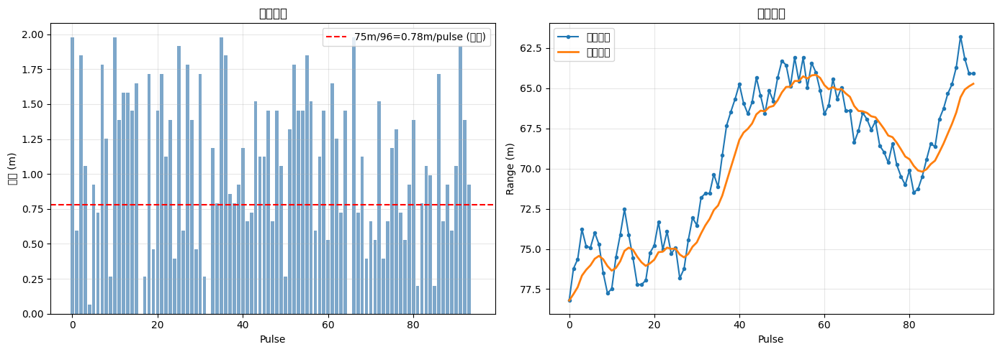

原始轨迹累积路程: 101.0 m
起点到终点直线距离: 14.1 m
期望: ~75 m
位移=0 的帧数: 4/95
位移>0.5m 的帧数: 79/95
原始距离范围: 61.8 ~ 78.2 m


In [37]:
# ====== 诊断: 到底每帧走了多少 ======

# 逐帧位移
disps = []
for p in range(1, N_PULSE):
    x0, y0 = pos_to_xy(raw_r[p-1], raw_b[p-1])
    x1, y1 = pos_to_xy(raw_r[p], raw_b[p])
    disps.append(np.sqrt((x1-x0)**2 + (y1-y0)**2))
disps = np.array(disps)

total_raw = sum(disps)
x0, y0 = pos_to_xy(raw_r[0], raw_b[0])
x1, y1 = pos_to_xy(raw_r[-1], raw_b[-1])
straight = np.sqrt((x1-x0)**2 + (y1-y0)**2)

fig, axes = plt.subplots(1, 2, figsize=(14, 5))

ax = axes[0]
ax.bar(np.arange(len(disps)), disps, color='steelblue', alpha=0.7)
ax.axhline(0.78, color='red', ls='--', lw=1.5, label='75m/96=0.78m/pulse (期望)')
ax.set_xlabel('Pulse'); ax.set_ylabel('位移 (m)')
ax.set_title('每帧位移'); ax.legend(); ax.grid(True, alpha=0.3)

ax = axes[1]
ax.plot(raw_r, '-o', ms=3, label='原始距离')
ax.plot(bright_r, '-', lw=2, label='平滑距离')
ax.set_xlabel('Pulse'); ax.set_ylabel('Range (m)')
ax.set_title('距离序列'); ax.legend(); ax.grid(True, alpha=0.3)
ax.invert_yaxis()

plt.tight_layout()
plt.show()

print(f'原始轨迹累积路程: {total_raw:.1f} m')
print(f'起点到终点直线距离: {straight:.1f} m')
print(f'期望: ~75 m')
print(f'位移=0 的帧数: {np.sum(disps < 0.01)}/{len(disps)}')
print(f'位移>0.5m 的帧数: {np.sum(disps > 0.5)}/{len(disps)}')
print(f'原始距离范围: {raw_r.min():.1f} ~ {raw_r.max():.1f} m')

In [26]:
print(f'[OLD] 3D 立方体: 脉冲压缩 → {N_BEAMS_FULL}波束 CBF (GPU)...')
t0 = time.time()

cube = np.zeros((N_RANGE, N_BEAMS_FULL, N_PULSE), dtype=np.float32)

for p in range(N_PULSE):
    cube[:, :, p] = gpu_compress_bf(data[:, :, p], S_full_g)

cp.cuda.Stream.null.synchronize()
print(f'完成! {time.time()-t0:.1f}s')

# 释放原始数据 (两种方法都跑完了)

print('原始数wei释放')

# 归一化
normed = np.empty_like(cube)
for p in range(N_PULSE):
    f = 10 * np.log10(cube[:, :, p] + 1e-30)
    f -= uniform_filter1d(f, size=64, axis=0, mode='reflect')
    f -= uniform_filter1d(f, size=32, axis=1, mode='reflect')
    normed[:, :, p] = f

btr = np.max(normed, axis=0)
rtr = np.max(normed, axis=1)
rb  = np.mean(normed, axis=2)

# CFAR + 轨迹
thresh = max(8.0, np.mean(normed) + 3.5 * np.std(normed))
print(f'CFAR 阈值: {thresh:.1f} dB')

dets_by_p = {}
total = 0
for p in range(N_PULSE):
    f = normed[:, :, p]
    lm = maximum_filter(f, size=9)
    pk = np.argwhere((f > thresh) & (f == lm))
    if len(pk) > 0:
        pd = np.column_stack([np.full(len(pk), p), R_AXIS[pk[:,0]],
                              THETA_FULL[pk[:,1]], f[pk[:,0], pk[:,1]]]).astype(np.float32)
        dets_by_p[p] = pd
        total += len(pk)

print(f'检测点: {total}')

tracks = []
if total > 0:
    det_all = np.vstack(list(dets_by_p.values()))
    used = set()
    for seed in np.argsort(-det_all[:, 3]):
        if seed in used: continue
        trk = [seed]; used.add(seed); cur = det_all[seed]
        for pn in range(int(cur[0]) + 1, N_PULSE):
            if pn not in dets_by_p: continue
            pd = dets_by_p[pn]
            base = sum(len(dets_by_p[pp]) for pp in sorted(dets_by_p) if pp < pn)
            valid = [(i, base + i) for i in range(len(pd)) if base + i not in used]
            if not valid: continue
            li, gi = zip(*valid); cand = pd[list(li)]
            cost = np.sqrt(((cand[:,1] - cur[1]) / 2)**2 + ((cand[:,2] - cur[2]) / 5)**2)
            bi = np.argmin(cost)
            if cost[bi] < 6 * max(1, pn - int(cur[0])):
                trk.append(gi[bi]); used.add(gi[bi]); cur = det_all[gi[bi]]
        if len(trk) >= 5:
            tracks.append(det_all[trk])
    tracks.sort(key=lambda t: -len(t))

print(f'轨迹: {len(tracks)} 条')
for i, t in enumerate(tracks[:3]):
    print(f'  Track {i+1}: {len(t)}pts, R=[{t[:,1].min():.1f},{t[:,1].max():.1f}]m, B=[{t[:,2].min():.1f},{t[:,2].max():.1f}]°')

del cube  # 释放

[OLD] 3D 立方体: 脉冲压缩 → 361波束 CBF (GPU)...
完成! 0.8s
原始数wei释放
CFAR 阈值: 12.5 dB
检测点: 237
轨迹: 10 条
  Track 1: 44pts, R=[6.1,95.8]m, B=[0.0,0.0]°
  Track 2: 40pts, R=[9.2,78.5]m, B=[0.0,0.0]°
  Track 3: 32pts, R=[9.6,97.3]m, B=[0.0,0.0]°


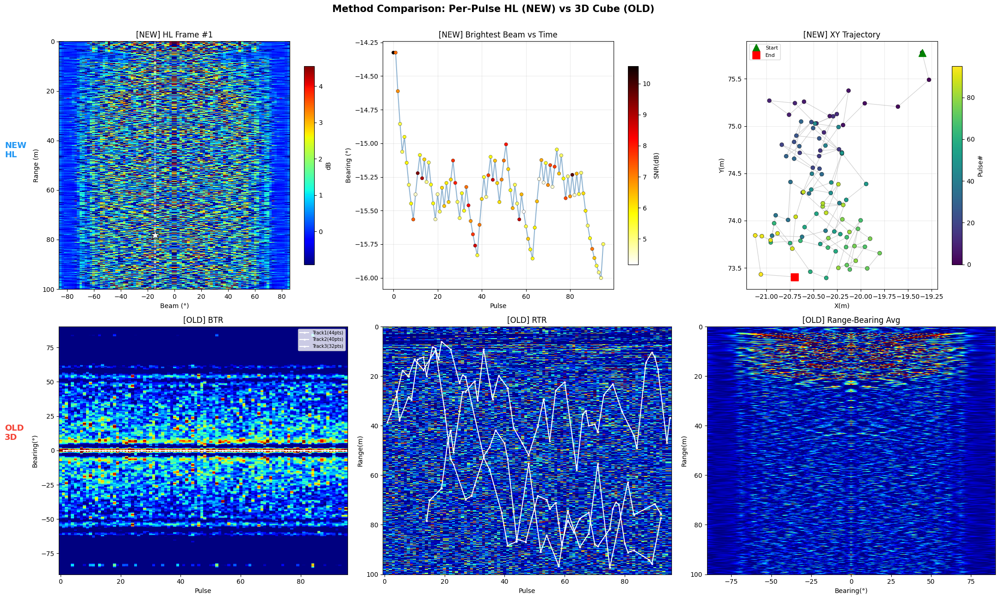

In [27]:
pa = np.arange(N_PULSE)

fig, axes = plt.subplots(2, 3, figsize=(22, 13))
fig.text(0.5, 0.98,
         'Method Comparison: Per-Pulse HL (NEW) vs 3D Cube (OLD)',
         ha='center', fontsize=15, fontweight='bold')
fig.text(0.02, 0.75, 'NEW\nHL', fontsize=13, fontweight='bold', color='#2196F3', ha='left', va='center')
fig.text(0.02, 0.28, 'OLD\n3D', fontsize=13, fontweight='bold', color='#F44336', ha='left', va='center')

# --- 上排: 新方法 ---
ax = axes[0,0]
bp = np.argmax(snr)
v0, v1 = np.percentile(hl_norm, [20, 99])
im = ax.pcolormesh(BEAM_ANGLES, R_AXIS, hl_norm[bp], shading='auto', cmap='jet', vmin=v0, vmax=v1)
ax.plot(bright_b[bp], bright_r[bp], 'w*', ms=16, markeredgecolor='k', markeredgewidth=0.8)
ax.axvline(bright_b[bp], color='w', lw=1.5, ls='--', alpha=0.7)
ax.set_xlabel('Beam (°)'); ax.set_ylabel('Range (m)')
ax.set_title(f'[NEW] HL Frame #{bp+1}'); ax.invert_yaxis()
plt.colorbar(im, ax=ax, label='dB', shrink=0.8)

ax = axes[0,1]
sc = ax.scatter(pa, bright_b, c=snr, cmap='hot_r', s=28, edgecolors='k', lw=0.3, zorder=5)
ax.plot(pa, bright_b, '-', color='steelblue', lw=1.5, alpha=0.6)
ax.set_xlabel('Pulse'); ax.set_ylabel('Bearing (°)')
ax.set_title('[NEW] Brightest Beam vs Time'); ax.grid(True, alpha=0.25)
plt.colorbar(sc, ax=ax, label='SNR(dB)', shrink=0.8)

ax = axes[0,2]
x = bright_r * np.sin(np.radians(bright_b)); y = bright_r * np.cos(np.radians(bright_b))
sc = ax.scatter(x, y, c=pa, cmap='viridis', s=40, edgecolors='k', lw=0.4, zorder=5)
ax.plot(x, y, '-', color='gray', lw=0.8, alpha=0.4)
ax.plot(x[0], y[0], 'g^', ms=12, label='Start', zorder=6)
ax.plot(x[-1], y[-1], 'rs', ms=12, label='End', zorder=6)
ax.set_xlabel('X(m)'); ax.set_ylabel('Y(m)')
ax.set_title('[NEW] XY Trajectory'); ax.set_aspect('equal')
ax.grid(True, alpha=0.25); ax.legend(fontsize=8)
plt.colorbar(sc, ax=ax, label='Pulse#', shrink=0.8)

# --- 下排: 旧方法 ---
ax = axes[1,0]
v0, v1 = np.percentile(btr, [40, 99])
ax.pcolormesh(pa, THETA_FULL, btr, shading='auto', cmap='jet', vmin=v0, vmax=v1)
for i, t in enumerate(tracks[:3]):
    ax.plot(t[:,0], t[:,2], 'w-o', ms=2, lw=1.5, label=f'Track{i+1}({len(t)}pts)')
ax.set_xlabel('Pulse'); ax.set_ylabel('Bearing(°)')
ax.set_title('[OLD] BTR')
if tracks: ax.legend(fontsize=7, loc='upper right')

ax = axes[1,1]
v0, v1 = np.percentile(rtr, [40, 99])
ax.pcolormesh(pa, R_AXIS, rtr, shading='auto', cmap='jet', vmin=v0, vmax=v1)
for t in tracks[:3]: ax.plot(t[:,0], t[:,1], 'w-o', ms=2, lw=1.5)
ax.set_xlabel('Pulse'); ax.set_ylabel('Range(m)')
ax.set_title('[OLD] RTR'); ax.invert_yaxis()

ax = axes[1,2]
v0, v1 = np.percentile(rb, [40, 99])
ax.pcolormesh(THETA_FULL, R_AXIS, rb, shading='auto', cmap='jet', vmin=v0, vmax=v1)
ax.set_xlabel('Bearing(°)'); ax.set_ylabel('Range(m)')
ax.set_title('[OLD] Range-Bearing Avg'); ax.invert_yaxis()

plt.tight_layout(rect=[0.04, 0, 1, 0.96])
fig.savefig(os.path.join(OUTPUT_DIR, 'method_comparison.png'), dpi=150, bbox_inches='tight')
plt.show()

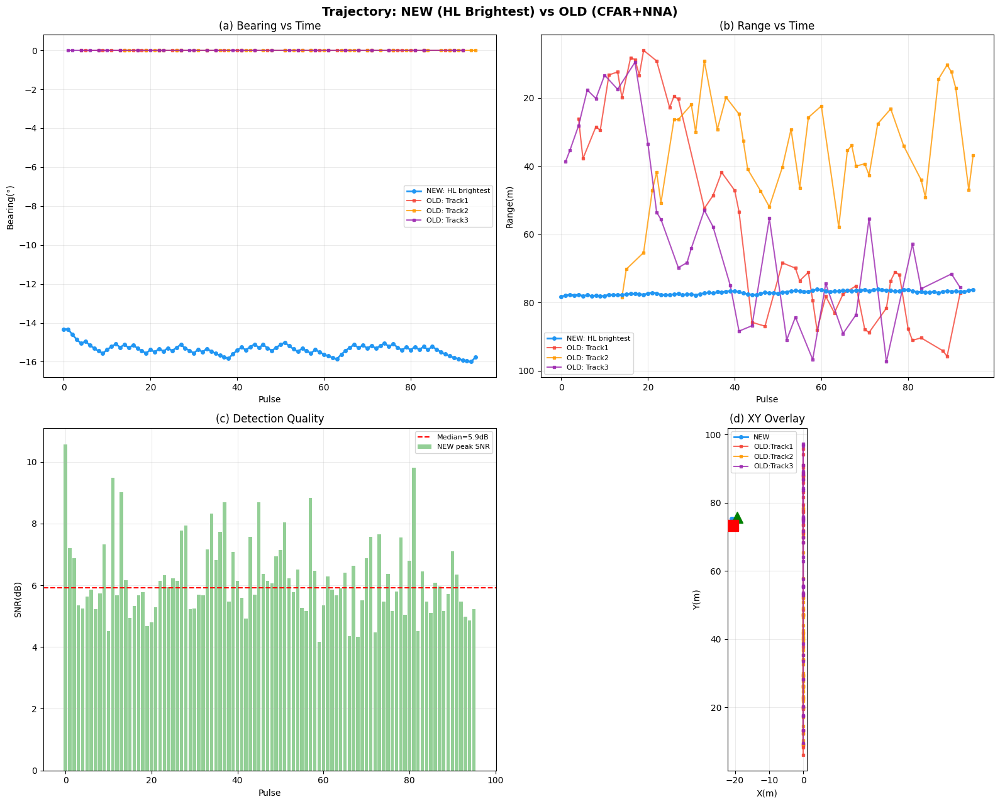

In [28]:
fig, axes = plt.subplots(2, 2, figsize=(16, 13))
fig.suptitle('Trajectory: NEW (HL Brightest) vs OLD (CFAR+NNA)', fontsize=14, fontweight='bold')

ax = axes[0,0]
ax.plot(pa, bright_b, '-o', ms=4, lw=2, color='#2196F3', label='NEW: HL brightest', zorder=5)
for i, t in enumerate(tracks[:3]):
    c = ['#F44336','#FF9800','#9C27B0'][i]
    ax.plot(t[:,0], t[:,2], '-s', ms=3, lw=1.5, color=c, label=f'OLD: Track{i+1}', alpha=0.8)
ax.set_xlabel('Pulse'); ax.set_ylabel('Bearing(°)')
ax.set_title('(a) Bearing vs Time'); ax.legend(fontsize=8); ax.grid(True, alpha=0.25)

ax = axes[0,1]
ax.plot(pa, bright_r, '-o', ms=4, lw=2, color='#2196F3', label='NEW: HL brightest', zorder=5)
for i, t in enumerate(tracks[:3]):
    c = ['#F44336','#FF9800','#9C27B0'][i]
    ax.plot(t[:,0], t[:,1], '-s', ms=3, lw=1.5, color=c, label=f'OLD: Track{i+1}', alpha=0.8)
ax.set_xlabel('Pulse'); ax.set_ylabel('Range(m)')
ax.set_title('(b) Range vs Time'); ax.legend(fontsize=8)
ax.grid(True, alpha=0.25); ax.invert_yaxis()

ax = axes[1,0]
ax.bar(pa, snr, color='#4CAF50', alpha=0.6, width=0.8, label='NEW peak SNR')
med = np.median(snr)
ax.axhline(med, color='red', ls='--', lw=1.5, label=f'Median={med:.1f}dB')
ax.set_xlabel('Pulse'); ax.set_ylabel('SNR(dB)')
ax.set_title('(c) Detection Quality'); ax.legend(fontsize=8); ax.grid(True, alpha=0.25)

ax = axes[1,1]
xn = bright_r * np.sin(np.radians(bright_b))
yn = bright_r * np.cos(np.radians(bright_b))
ax.plot(xn, yn, '-o', ms=4, lw=2, color='#2196F3', label='NEW', zorder=5)
ax.plot(xn[0], yn[0], 'g^', ms=13, zorder=6)
ax.plot(xn[-1], yn[-1], 'rs', ms=13, zorder=6)
for i, t in enumerate(tracks[:3]):
    c = ['#F44336','#FF9800','#9C27B0'][i]
    xt = t[:,1]*np.sin(np.radians(t[:,2])); yt = t[:,1]*np.cos(np.radians(t[:,2]))
    ax.plot(xt, yt, '-s', ms=3, lw=1.5, color=c, label=f'OLD:Track{i+1}', alpha=0.8)
ax.set_xlabel('X(m)'); ax.set_ylabel('Y(m)')
ax.set_title('(d) XY Overlay'); ax.set_aspect('equal')
ax.grid(True, alpha=0.25); ax.legend(fontsize=8)

plt.tight_layout()
fig.savefig(os.path.join(OUTPUT_DIR, 'trajectory_detail.png'), dpi=150, bbox_inches='tight')
plt.show()

In [29]:
FPS = 5  # 帧率, 可调

vmin, vmax = np.percentile(hl_norm, [15, 99.5])
frames = []
t0 = time.time()

for p in range(N_PULSE):
    fig = plt.figure(figsize=(15, 6.5), dpi=90)
    gs = fig.add_gridspec(1, 3, width_ratios=[3, 0.08, 1.8], wspace=0.3)

    # 左: HL 热力图
    ax1 = fig.add_subplot(gs[0, 0])
    im = ax1.pcolormesh(BEAM_ANGLES, R_AXIS, hl_norm[p],
                        shading='auto', cmap='jet', vmin=vmin, vmax=vmax)
    ax1.axvline(bright_b[p], color='w', lw=1.8, ls='--', alpha=0.85)
    ax1.plot(bright_b[p], bright_r[p], 'w*', ms=18, markeredgecolor='k', markeredgewidth=1)
    ax1.set_xlabel('Beam Angle (°)'); ax1.set_ylabel('Range (m)')
    ax1.invert_yaxis()
    ax1.set_title(f'Pulse {p+1:02d}/{N_PULSE}  |  '
                  f'Peak: {bright_b[p]:+.1f}°  {bright_r[p]:.1f}m  {snr[p]:.1f}dB',
                  fontsize=12, fontweight='bold', loc='left')
    cax = fig.add_subplot(gs[0, 1])
    plt.colorbar(im, cax=cax, label='dB')

    # 右: 累积轨迹
    ax2 = fig.add_subplot(gs[0, 2])
    s = slice(0, p+1)
    sc = ax2.scatter(bright_b[s], bright_r[s], c=np.arange(p+1), cmap='plasma',
                     s=35, edgecolors='k', lw=0.4, vmin=0, vmax=N_PULSE)
    if p > 0:
        ax2.plot(bright_b[s], bright_r[s], '-', color='gray', lw=0.8, alpha=0.4)
    ax2.plot(bright_b[p], bright_r[p], 'r*', ms=20, markeredgecolor='k',
             markeredgewidth=1.2, zorder=10)
    ax2.plot(bright_b[0], bright_r[0], 'g^', ms=10, zorder=9, label='Start')
    ax2.set_xlabel('Bearing (°)'); ax2.set_ylabel('Range (m)')
    ax2.set_title('Trajectory', fontweight='bold')
    ax2.set_xlim(BEAM_ANGLES[0]-5, BEAM_ANGLES[-1]+5)
    ax2.set_ylim(R_AXIS[-1]+1, max(0, R_AXIS[0]-1))
    ax2.grid(True, alpha=0.25); ax2.legend(fontsize=8, loc='upper right')

    fig.tight_layout()
    buf = io.BytesIO()
    fig.savefig(buf, format='png', bbox_inches='tight')
    buf.seek(0)
    frames.append(Image.open(buf).copy())
    buf.close()
    plt.close(fig)  # 关掉防内存泄漏, GIF帧已存到 frames 列表

    if (p+1) % 24 == 0:
        print(f'帧 {p+1}/{N_PULSE} ({time.time()-t0:.1f}s)')

gif_path = os.path.join(OUTPUT_DIR, 'sonar_hl_animation.gif')
frames[0].save(gif_path, save_all=True, append_images=frames[1:],
               duration=int(1000/FPS), loop=0, optimize=True)

print(f'\nGIF 已保存: {gif_path}')
print(f'{len(frames)} 帧, {FPS} fps, 耗时 {time.time()-t0:.1f}s')

帧 24/96 (6.2s)
帧 48/96 (12.0s)
帧 72/96 (17.8s)
帧 96/96 (23.6s)

GIF 已保存: /root/autodl-tmp/output/sonar_hl_animation.gif
96 帧, 5 fps, 耗时 25.4s



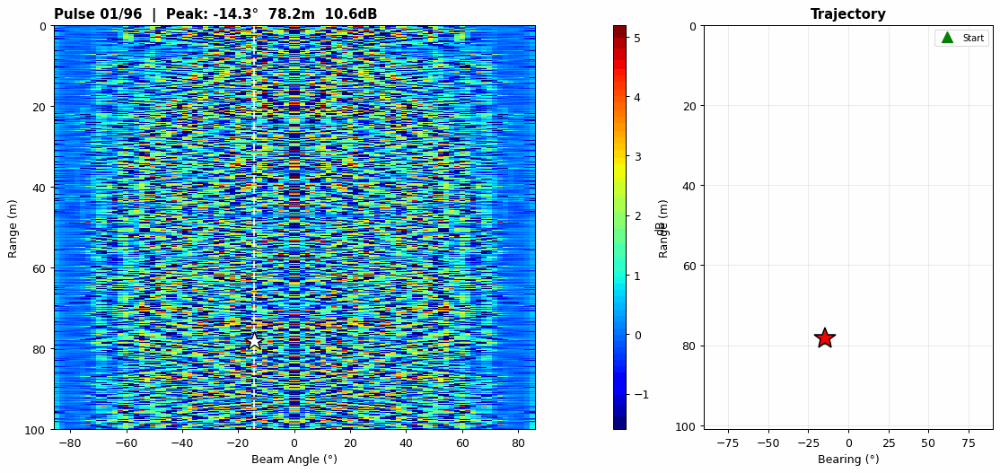

In [30]:
with open(gif_path, 'rb') as f:
    gif_b64 = base64.b64encode(f.read()).decode('utf-8')

display(HTML(f'''
<div style="text-align:center">
  <h3>HL Animation — Target Trajectory</h3>
  <img src="data:image/gif;base64,{gif_b64}"
       style="max-width:900px; border:1px solid #ccc; border-radius:8px;">
  <p style="color:gray; font-size:12px">
    {N_PULSE} pulses @ {FPS} fps | Left: per-pulse HL map | Right: cumulative trajectory
  </p>
</div>
'''))

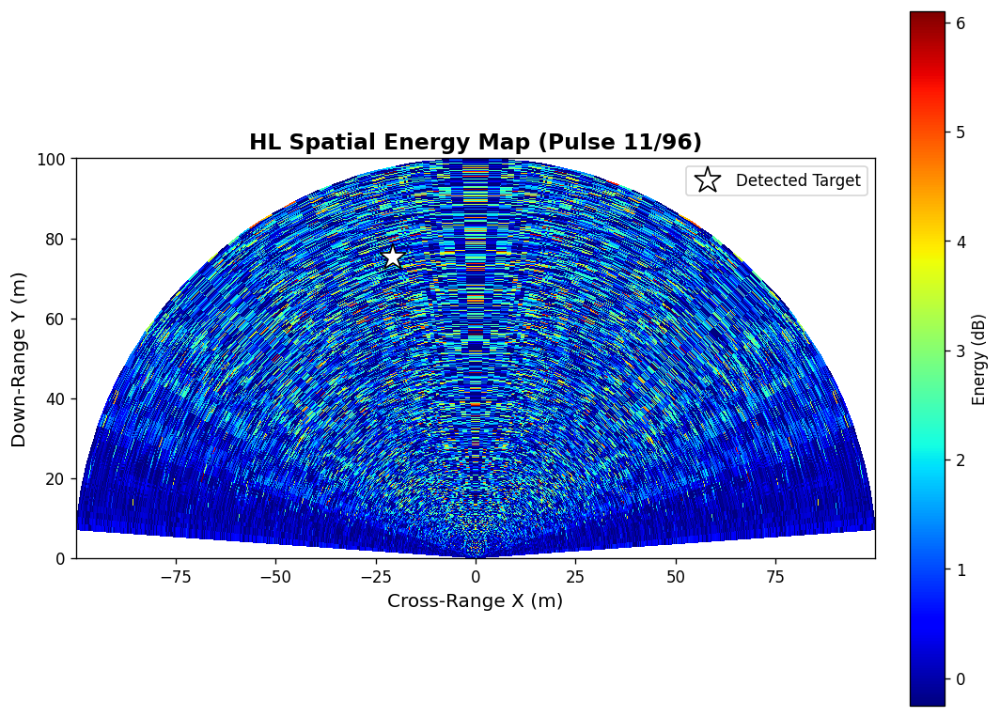

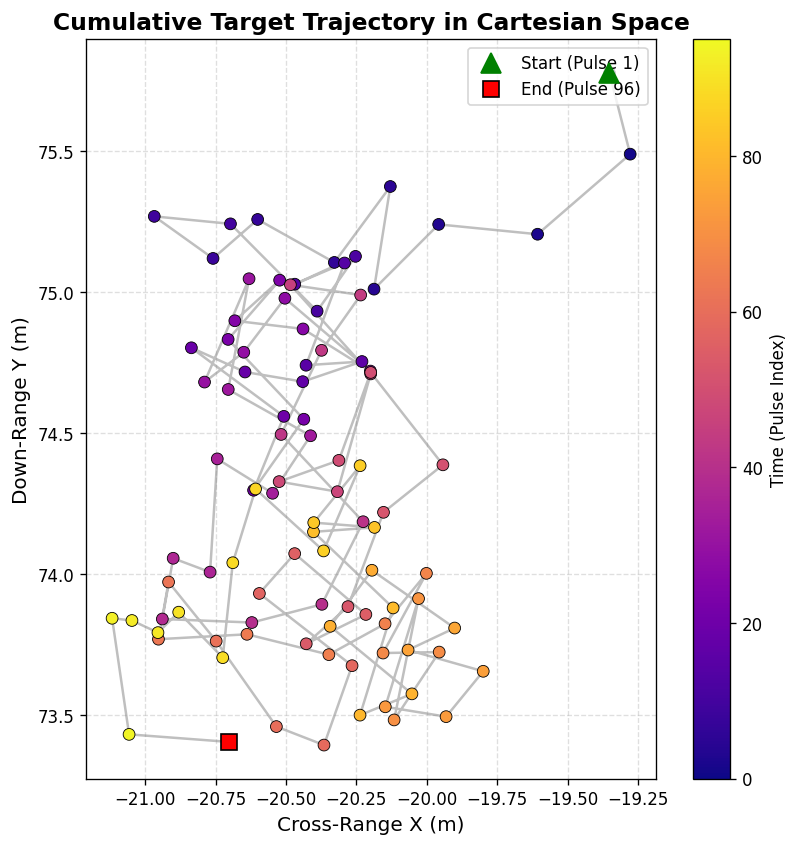

In [31]:
import numpy as np
import matplotlib.pyplot as plt

# ================= 准备工作：坐标系转换 =================
# 将角度转换为弧度
theta_rad = np.radians(BEAM_ANGLES)

# 构建 2D 网格，用于绘制空间扇形
R_grid, Theta_grid = np.meshgrid(R_AXIS, theta_rad, indexing='ij')

# 极坐标 (Range, Theta) 转笛卡尔坐标 (X, Y)
# 假设阵列在 (0,0) 位置，正前方对应 Y 轴，横向对应 X 轴
X_grid = R_grid * np.sin(Theta_grid)
Y_grid = R_grid * np.cos(Theta_grid)


# ================= 第一幅图：单帧 HL 空间能量分布图 =================
# 你可以随意修改 pulse_idx 来查看不同脉冲帧的画面
pulse_idx = 10 
frame_data = hl_norm[pulse_idx]

# 动态调整对比度（让目标更亮，背景噪音更暗）
vmin, vmax = np.percentile(frame_data, [30, 99.8])

fig1, ax1 = plt.subplots(figsize=(10, 8), dpi=120)
# pcolormesh 在传入真实 X_grid, Y_grid 时，会自动画出“扇形”雷达扫图效果
im1 = ax1.pcolormesh(X_grid, Y_grid, frame_data, cmap='jet', vmin=vmin, vmax=vmax, shading='auto')

# 标记该帧检测到的最大峰值目标
X_peak = bright_r[pulse_idx] * np.sin(np.radians(bright_b[pulse_idx]))
Y_peak = bright_r[pulse_idx] * np.cos(np.radians(bright_b[pulse_idx]))
ax1.plot(X_peak, Y_peak, 'w*', markersize=18, markeredgecolor='k', label='Detected Target')

ax1.set_xlabel('Cross-Range X (m)', fontsize=12)
ax1.set_ylabel('Down-Range Y (m)', fontsize=12)
ax1.set_title(f'HL Spatial Energy Map (Pulse {pulse_idx+1}/{N_PULSE})', fontsize=14, fontweight='bold')
ax1.set_aspect('equal', 'box')  # 【关键】确保 X 和 Y 比例 1:1，还原真实物理世界
plt.colorbar(im1, ax=ax1, label='Energy (dB)', fraction=0.046, pad=0.04)
ax1.legend(loc='upper right')
plt.show()


# ================= 第二幅图：多脉冲累计的 X-Y 真实运动轨迹 =================
fig2, ax2 = plt.subplots(figsize=(10, 8), dpi=120)

# 转换所有被提取出的最高亮点的坐标 (X, Y)
X_track = bright_r * np.sin(np.radians(bright_b))
Y_track = bright_r * np.cos(np.radians(bright_b))

# 1. 画一条底层的浅色折线，串联轨迹
ax2.plot(X_track, Y_track, '-', color='gray', lw=1.5, alpha=0.5)

# 2. 画散点，用颜色深浅（cmap='plasma'）来代表时间的推移（脉冲序列）
scatter = ax2.scatter(X_track, Y_track, c=np.arange(N_PULSE), cmap='plasma', 
                      s=50, edgecolor='k', linewidth=0.5, zorder=5)

# 3. 标记轨迹的起点和终点
ax2.plot(X_track[0], Y_track[0], 'g^', markersize=12, zorder=10, label='Start (Pulse 1)')
ax2.plot(X_track[-1], Y_track[-1], 'rs', markersize=10, markeredgecolor='k', zorder=10, label=f'End (Pulse {N_PULSE})')

ax2.set_xlabel('Cross-Range X (m)', fontsize=12)
ax2.set_ylabel('Down-Range Y (m)', fontsize=12)
ax2.set_title('Cumulative Target Trajectory in Cartesian Space', fontsize=14, fontweight='bold')
ax2.set_aspect('equal', 'box')  # 同样保持物理长宽比
ax2.grid(True, linestyle='--', alpha=0.4)
plt.colorbar(scatter, ax=ax2, label='Time (Pulse Index)', fraction=0.046, pad=0.04)
ax2.legend(loc='upper right')

plt.show()

In [32]:
import cupy as cp
import numpy as np
from scipy.ndimage import uniform_filter

def gpu_mvdr_bf(pulse_data_np, S_g, H_g, R_IDX_g):
    """
    GPU端高分辨率波束形成 (MVDR) 替代常规的 CBF。
    融合了匹配滤波 (脉压) 和 MVDR 空间谱估计。
    """
    # 1. 将数据载入显存并补零
    buf = cp.zeros((N_CH, N_FFT), dtype=cp.float32)
    buf[:, :N_SAMP] = cp.asarray(pulse_data_np)
    
    # 2. 纵轴：宽带信号脉冲压缩 (Matched Filter)
    comp = cp.fft.irfft(cp.fft.rfft(buf, axis=1) * H_g[None, :], n=N_FFT, axis=1)
    
    # 截取感兴趣的距离段 (Snapshots)
    snap = comp[:, R_IDX_g].astype(cp.complex64)  # 形状: (16通道, N_RANGE)
    
    N_R = snap.shape[1]
    N_B = S_g.shape[1]
    P_mvdr = cp.zeros((N_R, N_B), dtype=cp.float32)
    
    # ================= 横轴：MVDR 核心处理 =================
    L = 2        # 空间平滑/滑动窗口半宽 (利用前后共5个距离单元估计协方差)
    eps = 1e-3   # 对角加载系数 (Diagonal Loading) 防止矩阵不可逆
    I = cp.eye(N_CH, dtype=cp.complex64)
    
    # 遍历每个距离单元计算高分辨率空间谱
    for i in range(N_R):
        # 提取窗口内的快拍数据
        start = max(0, i - L)
        end = min(N_R, i + L + 1)
        X = snap[:, start:end]
        
        # 估计接收信号的协方差矩阵 R
        R = (X @ X.conj().T) / X.shape[1] + eps * I
        
        # 对 R 求逆
        R_inv = cp.linalg.inv(R)
        
        # 计算 MVDR 功率谱: P = 1 / (a^H * R^-1 * a)
        weight = R_inv @ S_g                 # R^-1 * a
        denom = cp.sum(S_g.conj() * weight, axis=0) # a^H * R^-1 * a
        
        P_mvdr[i, :] = cp.real(1.0 / denom)
        
    # 返回到 CPU 上供后续 CFAR 和画图使用
    return cp.asnumpy(P_mvdr)

# ----------------- 运行处理 -----------------
print("正在执行 MVDR 高分辨率处理 (可能比 CBF 稍慢)...")
# 假设我们要处理第10个脉冲来展示第一幅图
pulse_idx = 10 
# 这里调用上面写好的函数 (确保 S_hl_g 和 H_g 已经在你的显存中了)
mvdr_map_linear = gpu_mvdr_bf(data[:, :, pulse_idx], S_hl_g, H_g, R_IDX_g)

# 动态范围压缩 (Log Compression) 与归一化
mvdr_map_db = 10 * np.log10(mvdr_map_linear + 1e-10)
mvdr_map_db -= np.max(mvdr_map_db) # 归一化到最大值 0dB

正在执行 MVDR 高分辨率处理 (可能比 CBF 稍慢)...
